In [2]:
import os
import pandas as pd
import sys
import datetime
import math
import time
import folium
from vega import VegaLite

In [133]:
start_time = time.time()

dataPath = os.getcwd() + "/data/buste/"

dataByDay = pd.read_csv(dataPath + "test") # TODO just for test

C:\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2717: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [134]:
dataByDay

,route,tripNum,shapeId,shapeSequence,shapeLat,shapeLon,distanceTraveledShape,busCode,gpsPointId,gpsLat,...,distanceToShapePoint,timestamp,stopPointId,problem,birthdate,cardTimestamp,lineName,cardNum,gender,date
0,463,1,2846,6348468,-25.478025,-49.203033,1128.772,DC090,-,-25.477931,...,10.472111,05:48:27,31707,NO_PROBLEM,18/10/63,05:49:19,SOLITUDE,0000840541,M,2017_04_30
1,463,1,2846,6348493,-25.474027,-49.209193,1899.853,DC090,-,-25.47397,...,8.772267,05:49:55,31524,NO_PROBLEM,-,-,-,-,-,2017_04_30
2,463,1,2846,6348516,-25.468650,-49.213528,2638.152,DC090,-,-,...,-,05:51:18,31521,BETWEEN,-,-,-,-,-,2017_04_30
3,463,1,2846,6348531,-25.464090,-49.217170,3262.176,DC090,-,-25.464081,...,5.7705736,05:52:09,31517,NO_PROBLEM,-,-,-,-,-,2017_04_30
4,463,1,2846,6348545,-25.459453,-49.220872,3896.639,DC090,-,-,...,-,05:53:01,31515,BETWEEN,-,-,-,-,-,2017_04_30
5,463,1,2846,6348584,-25.449051,-49.229171,5319.660,DC090,-,-25.449208,...,33.176514,05:54:56,30940,NO_PROBLEM,-,-,-,-,-,2017_04_30
6,463,1,2846,6348618,-25.443967,-49.237920,6498.419,DC090,-,-25.443921,...,12.4023,05:56:55,30929,NO_PROBLEM,23/12/90,05:57:45,SOLITUDE,0003545809,M,2017_04_30
7,463,1,2846,6348633,-25.443721,-49.244043,7121.418,DC090,-,-25.443733,...,14.410789,05:58:32,30918,NO_PROBLEM,-,-,-,-,-,2017_04_30
8,463,1,2846,6348646,-25.442238,-49.247550,7514.514,DC090,-,-25.442238,...,8.5232115,05:59:21,30913,NO_PROBLEM,-,-,-,-,-,2017_04_30
9,463,1,2846,6348663,-25.440642,-49.248702,7745.813,DC090,-,-25.440666,...,8.675287,05:59:54,30909,NO_PROBLEM,-,-,-,-,-,2017_04_30


In [135]:
# Remove unusable columns
dataByDay = dataByDay.drop(['shapeSequence', 'distanceTraveledShape', 'gpsPointId', 'distanceToShapePoint', 'stopPointId',
                            'problem', 'birthdate', 'boarding_id', 'boarding_datetime', 'lineName', 
                            'cardNum', 'gender'], axis = 1)
dataByDay.shape

(112729, 9)

In [136]:
before = dataByDay.shape[0]

# Removing data without gps point
before = dataByDay.shape[0]
dataByDay = dataByDay[dataByDay.gpsLat != "-"]
print("After remove rows without GPS: ", dataByDay.shape)
after = dataByDay.shape[0]
deleted_rows = before - after
print("Deleted rows", deleted_rows)

# Fixing index by number of rows
dataByDay = dataByDay.reset_index(drop = True)

dataByDay

(65603, 9)


,route,shapeId,shapeLat,shapeLon,busCode,gpsLat,gpsLon,timestamp,date
0,463,2846,-25.478025,-49.203033,DC090,-25.477931,-49.203043,05:48:27,2017_04_30
1,463,2846,-25.474027,-49.209193,DC090,-25.47397,-49.209133,05:49:55,2017_04_30
2,463,2846,-25.464090,-49.217170,DC090,-25.464081,-49.217113,05:52:09,2017_04_30
3,463,2846,-25.449051,-49.229171,DC090,-25.449208,-49.22889,05:54:56,2017_04_30
4,463,2846,-25.443967,-49.237920,DC090,-25.443921,-49.237808,05:56:55,2017_04_30
5,463,2846,-25.443721,-49.244043,DC090,-25.443733,-49.2439,05:58:32,2017_04_30
6,463,2846,-25.442238,-49.247550,DC090,-25.442238,-49.247465,05:59:21,2017_04_30
7,463,2846,-25.440642,-49.248702,DC090,-25.440666,-49.24862,05:59:54,2017_04_30
8,463,2846,-25.438697,-49.260751,DC090,-25.438896,-49.260643,06:04:53,2017_04_30
9,463,2846,-25.432775,-49.270209,DC090,-25.43285,-49.270226,06:12:45,2017_04_30


In [137]:
# Creating new column id to index rows
dataByDay.insert(0, "id", dataByDay.index)

# Creating new column time to group by timestamp and reduce comparisons
dataByDay.insert(1, "time", dataByDay.gps_datetime.str[11:15])

In [138]:
 # Convert timestamp to date
dataByDay['date'] =  dataByDay['gps_datetime'].str.split(" ", n = 1).str[0]
dataByDay['gps_datetime'] =  pd.to_datetime(dataByDay['gps_datetime'])     

In [139]:
# Output dataframe to add Bus Bunching occurrence
outputBusBunching = dataByDay
outputBusBunching['busBunching'] = ""
print(outputBusBunching.shape)

outputBusBunching

(65603, 12)


,id,time,route,shapeId,shapeLat,shapeLon,busCode,gpsLat,gpsLon,timestamp,date,busBunching
0,0,05:4,463,2846,-25.478025,-49.203033,DC090,-25.477931,-49.203043,2017-04-30 05:48:27,2017-04-30,
1,1,05:4,463,2846,-25.474027,-49.209193,DC090,-25.47397,-49.209133,2017-04-30 05:49:55,2017-04-30,
2,2,05:5,463,2846,-25.464090,-49.217170,DC090,-25.464081,-49.217113,2017-04-30 05:52:09,2017-04-30,
3,3,05:5,463,2846,-25.449051,-49.229171,DC090,-25.449208,-49.22889,2017-04-30 05:54:56,2017-04-30,
4,4,05:5,463,2846,-25.443967,-49.237920,DC090,-25.443921,-49.237808,2017-04-30 05:56:55,2017-04-30,
5,5,05:5,463,2846,-25.443721,-49.244043,DC090,-25.443733,-49.2439,2017-04-30 05:58:32,2017-04-30,
6,6,05:5,463,2846,-25.442238,-49.247550,DC090,-25.442238,-49.247465,2017-04-30 05:59:21,2017-04-30,
7,7,05:5,463,2846,-25.440642,-49.248702,DC090,-25.440666,-49.24862,2017-04-30 05:59:54,2017-04-30,
8,8,06:0,463,2846,-25.438697,-49.260751,DC090,-25.438896,-49.260643,2017-04-30 06:04:53,2017-04-30,
9,9,06:1,463,2846,-25.432775,-49.270209,DC090,-25.43285,-49.270226,2017-04-30 06:12:45,2017-04-30,


In [140]:
def distanceBetween(origin, destination):
    """
    Calculate the Haversine distance.

    Parameters
    ----------
    origin : tuple of float
        (lat, long)
    destination : tuple of float
        (lat, long)

    Returns
    -------
    distance_in_m : float

    Examples
    --------
    >>> origin = (48.1372, 11.5756)  # Munich
    >>> destination = (52.5186, 13.4083)  # Berlin
    >>> round(distance(origin, destination), 1)
    504.2
    """
    lat1, lon1 = origin
    lat2, lon2 = destination
    radius = 6371  # km

    dlat = math.radians(lat2 - lat1)
    dlon = math.radians(lon2 - lon1)
    a = (math.sin(dlat / 2) * math.sin(dlat / 2) +
         math.cos(math.radians(lat1)) * math.cos(math.radians(lat2)) *
         math.sin(dlon / 2) * math.sin(dlon / 2))
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    d = radius * c

    return d * 1000 #meters

In [141]:
DISTANCE_THRESHOLD = 100 # meters

def isBusBunching(distance):
    """
    Detecting Bus Bunching.

    Parameters
    ----------
    distance : distance between two gps points
        float

    Returns
    -------
    is_bus_bunching : boolean

    Examples
    --------
    >>> distance = 98.08
    true
    """
    return distance < DISTANCE_THRESHOLD

In [142]:
# Mapping route - buses

# Mapping route - buses
route_buses_dic = dataByDay.groupby(['route', 'time', 'shapeId']).apply(lambda f: f[["id", "time", "route", "tripNum", 
                                                                                     "shapeId", "shapeLat", "shapeLon", 
                                                                                     "busCode", "gpsLat", "gpsLon", 
                                                                                     "gps_datetime", 
                                                                                     "date"]].values.tolist()).to_dict()

In [143]:
dataByDay

,id,time,route,shapeId,shapeLat,shapeLon,busCode,gpsLat,gpsLon,timestamp,date,busBunching
0,0,05:4,463,2846,-25.478025,-49.203033,DC090,-25.477931,-49.203043,2017-04-30 05:48:27,2017-04-30,
1,1,05:4,463,2846,-25.474027,-49.209193,DC090,-25.47397,-49.209133,2017-04-30 05:49:55,2017-04-30,
2,2,05:5,463,2846,-25.464090,-49.217170,DC090,-25.464081,-49.217113,2017-04-30 05:52:09,2017-04-30,
3,3,05:5,463,2846,-25.449051,-49.229171,DC090,-25.449208,-49.22889,2017-04-30 05:54:56,2017-04-30,
4,4,05:5,463,2846,-25.443967,-49.237920,DC090,-25.443921,-49.237808,2017-04-30 05:56:55,2017-04-30,
5,5,05:5,463,2846,-25.443721,-49.244043,DC090,-25.443733,-49.2439,2017-04-30 05:58:32,2017-04-30,
6,6,05:5,463,2846,-25.442238,-49.247550,DC090,-25.442238,-49.247465,2017-04-30 05:59:21,2017-04-30,
7,7,05:5,463,2846,-25.440642,-49.248702,DC090,-25.440666,-49.24862,2017-04-30 05:59:54,2017-04-30,
8,8,06:0,463,2846,-25.438697,-49.260751,DC090,-25.438896,-49.260643,2017-04-30 06:04:53,2017-04-30,
9,9,06:1,463,2846,-25.432775,-49.270209,DC090,-25.43285,-49.270226,2017-04-30 06:12:45,2017-04-30,


In [144]:
for row in dataByDay.itertuples():
    """
    Index=0, id=0, time='05:4', route=463, tripNum=1, shapeId=2846, shapeLat=-25.478024708433903, 
    shapeLon=-49.203032595858183, busCode='DC090', gpsLat='-25.477931', gpsLon='-49.203043', 
    gps_datetime=Timestamp('2017-04-30 05:48:27'), date='2017-04-30', busBunching=''
    """

    indexFirstBus = row[1]
    timeFirstBus = row[2]
    routeFirstBus = row[3]
    shapeIdFirstBus = row[5]
    latitudeFirstBus = row[6]
    longitudeFirstBus = row[7]
    codeFirstBus = row[8]
    timestampFirstBus = row[11]

    closestTime = ""
    previousBus = ""

    # Compare buses from the same route and shape id (avoiding buses in opposite trips, e.g.)
    # and in time range (avoiding buses in different hours, e.g.)
    buses_same_route = route_buses_dic[routeFirstBus, timeFirstBus, shapeIdFirstBus]

    for rowOtherBus in buses_same_route:
        """
        [0, '05:4', 463, 1, 2846, -25.478024708433903, -49.20303259585818, 'DC090', '-25.477931', '-49.203043', 
        Timestamp('2017-04-30 05:48:27'), '2017-04-30']
        """

        indexOtherBus = rowOtherBus[0]
        routeOtherBus = rowOtherBus[2]
        codeOtherBus = rowOtherBus[7]
        timestampOtherBus = rowOtherBus[10]
        latitudeOtherBus = rowOtherBus[5]
        longitudeOtherBus = rowOtherBus[6]


        if (codeOtherBus != codeFirstBus): # avoiding to compare with the same bus
            difTime = abs(timestampOtherBus - timestampFirstBus)

            if (previousBus == codeOtherBus):

                #find the nearest timestamps

                if (difTime < closestTime):
                    closestTime = difTime
                    closestBusCode = codeOtherBus
                    closestLat = latitudeOtherBus
                    closestLon = longitudeOtherBus
                    closestID = indexOtherBus

            else:
                #first, analyse the last bus

                if (closestTime != "" ):
                    distance = distanceBetween((float(latitudeFirstBus), float(longitudeFirstBus)), 
                                               (float(closestLat), float(closestLon)))

                    if (isBusBunching(distance, distanceThreshold)):
                        bbFirstBus = outputBusBunching.iloc[indexFirstBus]["busBunching"]
                        if (str(closestID) not in bbFirstBus):
                            outputBusBunching.loc[indexFirstBus,'busBunching'] = bbFirstBus + str(closestID) + "-"

                        bbClosestBus = outputBusBunching.iloc[closestID]["busBunching"]
                        if (str(indexFirstBus) not in bbClosestBus):
                            outputBusBunching.loc[closestID,'busBunching'] = bbClosestBus + str(indexFirstBus) + "-"

                # -----------------------------------------
                # New bus to compare: reseting variables
                previousBus = codeOtherBus
                closestTime = difTime
                closestBusCode = codeOtherBus
                closestLat = latitudeOtherBus
                closestLon = longitudeOtherBus
                closestID = indexOtherBus

In [145]:
outputBusBunching.loc[outputBusBunching['busBunching'] != ""]

,id,time,route,shapeId,shapeLat,shapeLon,busCode,gpsLat,gpsLon,timestamp,date,busBunching
43920,43920,16:0,203,3856,-25.377255,-49.223935,HD247,-25.377505,-49.224681,2017-04-30 16:09:44,2017-04-30,61632-
43949,43949,17:0,203,3855,-25.487704,-49.294297,HD247,-25.487673,-49.294251,2017-04-30 17:07:29,2017-04-30,61659-
61632,61632,16:0,203,3856,-25.377255,-49.223935,HD232,-25.377571,-49.22456,2017-04-30 16:02:29,2017-04-30,43920-
61659,61659,17:0,203,3855,-25.487704,-49.294297,HD232,-25.487613,-49.29428,2017-04-30 17:00:12,2017-04-30,43949-


In [146]:
executionTime = int(time.time() - start_time) / 60
print("--- %s minutes ---" % executionTime)

--- 0.7333333333333333 minutes ---


In [147]:
# Saving csv file
outputBusBunching.to_csv("outputBusBunching", index_label = "index", encoding = 'utf-8')

In [8]:
dayOfAnalysis = "2017-05-01.csv"
filePath = os.getcwd() + "/data/outputBusBunching/outputBusBunching-" + dayOfAnalysis
outputBusBunching = pd.read_csv(filePath)

b = outputBusBunching[outputBusBunching.route == 203]
bb = b.busCode.unique()

bb

dayOfAnalysis = "2017_05_01_veiculos.csv"
filePath = os.getcwd() + "/data/outputBusBunching/" + dayOfAnalysis
gps = pd.read_csv(filePath)



#203 = 107 trips em um dia, 41% BB
#BE703 = 10 trips em um dia, 60% with BB
#PLOTAR os GPS desses ônibus

In [24]:
gps_buses = gps[gps["bus.code"].isin(['BD146', 'BD135'])]#'BD146', 'BD135', 'GD350', 'BD147', 'BD136', 'HE711', 'BE703',
       #'BD138', 'HD242', 'HD241', 'BD142', 'BD139'])]

In [25]:
# Validating bus bunching at map

# create dic route - color
colors = {"orange", "blue", "brown", "pink", "black", "red", "green", "purple", "grey", "yellow", "magenta", "white"}
buses = gps_buses["bus.code"].unique()
routeColorDict = dict(zip(buses, colors))

# Make an empty map
m = folium.Map(tiles = "OpenStreetMap", zoom_start = 13, location = [-25.428777,-49.249120])

# I can add marker one by one on the map
for i in range(0, len(gps_buses)):
    route = gps_buses.iloc[i]['line.code']
    busCode = gps_buses.iloc[i]['bus.code']
    
    popup_data = "route: " + str(route) + " Bus Code: " + str(busCode) + " Timestamp: " + str(gps_buses.iloc[i]['timestamp'])

    folium.CircleMarker([gps_buses.iloc[i]['latitude'], gps_buses.iloc[i]['longitude']], popup = popup_data, 
                        color = routeColorDict[busCode], radius = 10, fill_opacity = 0.1).add_to(m)

# Save it as html
# m.save('bus_bunching_visualization.html')
m

In [26]:
gps_buses.shape

m.save('gps_visualization2-203.html')

A rota 203 parece que é exceção: cada ônibus faz um pedaço da canaleta, mas não o shape todo. - Inconsistência no shape

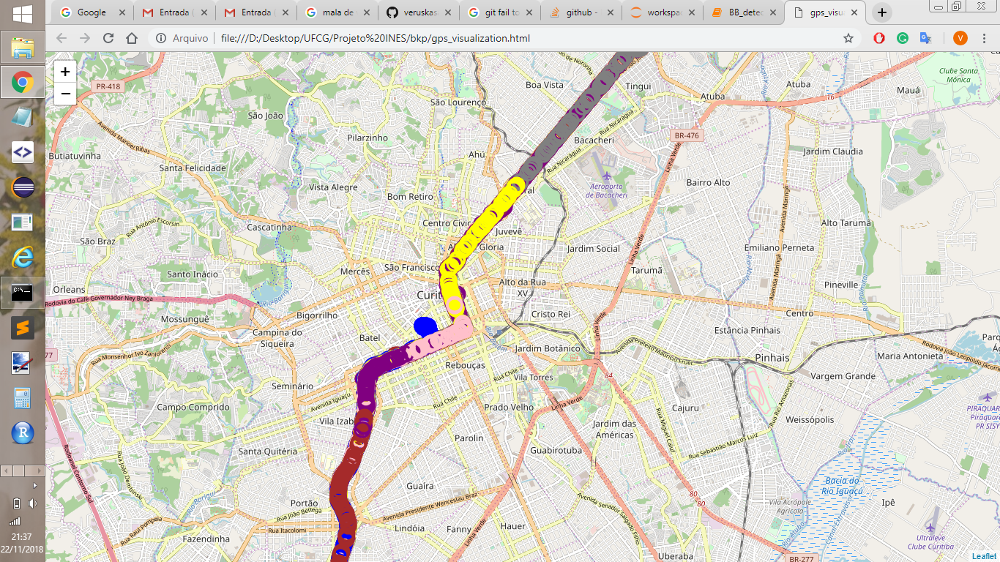

In [150]:
# TODO - agrupar por timestamp tbm
# - checar no mapa bb
# - rodar para 3 dias
# - fazer gráficos
# - rodar para 1 ano


# O que é cada linha do BUSTE? Pq há linhas sem coordenadas?
#_ A saída do BUSTE é parada de ônibus - cada linha.
#_ Mas não perde BB, pode ser usado.
#_ Pode usar o BULMA tbm, só que tem mais dados.

## Analysis (Day: 2017-04-30)

### Por rota

Total de rotas: 202

**Com aglomerados: 8 (4%)**

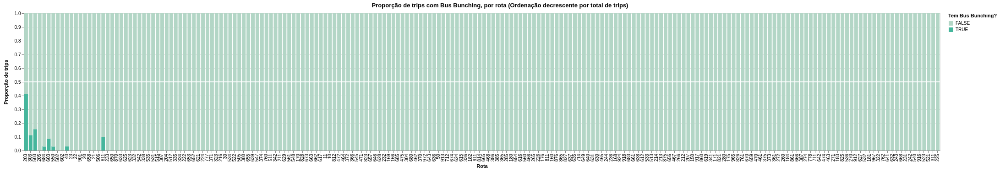

In [13]:
VegaLite({
  "$schema": "https://vega.github.io/schema/vega-lite/v2.json",
  "width": 2000,
  "height": 300,
  "title": {
    "text": "Proporção de trips com Bus Bunching, por rota (Ordenação decrescente por total de trips)"
  },
  "data": {
    "url": "https://gist.githubusercontent.com/veruskasantos/65e3b265d6ad8a4ca59427c8d2d9da34/raw/151e86d7a5055cb6c9e4d89f814402348a67ed80/bb_per_route_curitiba-2017-05-01.csv"
  },
  "transform": [
    {
      "calculate": "0.5",
      "as": "ref"
    }
  ],
  "layer": [
    {
      "mark": {
        "type": "bar",
        "size": 8
      },
      "encoding": {
        "x": {
          "field": "route",
          "type": "nominal",
          "axis": {
            "title": "Rota"
          },
          "sort": {
            "op": "sum",
            "field": "trips",
            "order": "descending"
          }
        },
        "color": {
          "field": "hasBusBunching",
          "type": "nominal","legend": {"title": "Tem Bus Bunching?"},
          "scale": {
            "range": [
              "#B3D6C6",
              "#45B69C"
            ]
          }
        },
        
        "y": {
          "field": "percTrips",
          "type": "quantitative",
          "stack": "normalize",
          "axis": {
            "title": "Proporção de trips"
          }
        },
        "tooltip": [
          {
            "field": "date",
            "type": "ordinal",
            "title": "Date"
          },
          {
            "field": "route",
            "type": "nominal",
            "title": "Route"
          },
          {
            "field": "hasBusBunching",
            "type": "nominal",
            "title": "Has BB?"
          },
          {
            "field": "trips",
            "type": "quantitative",
            "title": "Total trips"
          },
          {
            "field": "percTrips",
            "type": "quantitative",
            "title": "Trips %"
          }
        ]
      }
    },
    {
      "mark": "rule",
      "encoding": {
        "y": {
          "field": "ref",
          "type": "quantitative"
        },
        "color": {
          "value": "white"
        },
        "size": {
          "value": 2
        }
      }
    }
  ]
})

### Por ônibus

Total de ônibus: 411

**Com aglomerados: 34 (8%)**

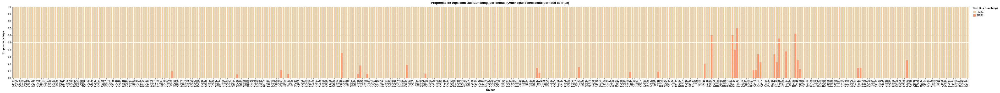

In [14]:
VegaLite(
{
  "$schema": "https://vega.github.io/schema/vega-lite/v2.json",
  "width": 4000,
  "height": 300,
  "title": {
    "text": "Proporção de trips com Bus Bunching, por ônibus (Ordenação decrescente por total de trips)"
  },
  "data": {
    "url": "https://gist.githubusercontent.com/veruskasantos/ed5136145c14c17e427243ae2925e62c/raw/7d5996317db78450dd7073223d17284fe68209ef/bb_per_bus_curitiba-2017-05-01.csv"
  },
  "transform": [
    {
      "calculate": "0.5",
      "as": "ref"
    }
  ],
  "layer": [
    {
      "mark": {
        "type": "bar",
        "size": 8
      },
      "encoding": {
        "x": {
          "field": "busCode",
          "type": "nominal",
          "axis": {
            "title": "Ônibus"
          },
          "sort": {
            "op": "sum",
            "field": "trips",
            "order": "descending"
          }
        },
        "color": {
          "field": "hasBusBunching",
          "type": "nominal",
          "legend": {
            "title": "Tem Bus Bunching?"
          },
          "scale": {
            "range": [
              "#EAD2AC",
              "#FF9B71"
            ]
          }
        },
        "y": {
          "field": "percTrips",
          "type": "quantitative",
          "stack": "normalize",
          "axis": {
            "title": "Proporção de trips"
          }
        },
        "tooltip": [
          {
            "field": "date",
            "type": "ordinal",
            "title": "Date"
          },
          {
            "field": "busCode",
            "type": "nominal",
            "title": "Bus Code"
          },
          {
            "field": "hasBusBunching",
            "type": "nominal",
            "title": "Has BB?"
          },
          {
            "field": "trips",
            "type": "quantitative",
            "title": "Total trips"
          },
          {
            "field": "percTrips",
            "type": "quantitative",
            "title": "Trips %"
          }
        ]
      }
    },
    {
      "mark": "rule",
      "encoding": {
        "y": {
          "field": "ref",
          "type": "quantitative"
        },
        "color": {
          "value": "white"
        },
        "size": {
          "value": 2
        }
      }
    }
  ]
})

### Por rota e horário

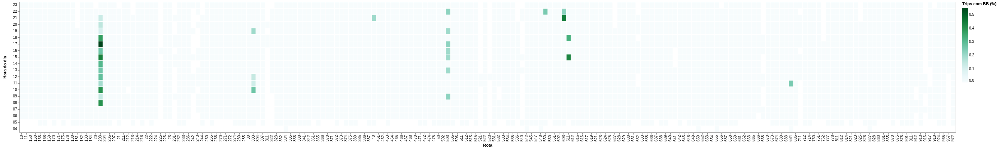

In [28]:
VegaLite({
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "width": 2500,
  "height": 350,
  "data": {"url": "https://gist.githubusercontent.com/veruskasantos/490655fcab74f0f7830f8081f65b6777/raw/18baf819a2b0087320132776255de232bdd73a40/bb_per_route_hour_curitiba-2017-05-01.csv"},
  "mark": {"type": "rect"},
  "encoding": {
    "y": {"field": "time", "type": "ordinal", "title": "Hora do dia", "sort":"descending"},
    "tooltip": [
          {
            "field": "date",
            "type": "ordinal",
            "title": "Date"
          },
        {
            "field": "time",
            "type": "ordinal",
            "title": "Hora"
          },
          {
            "field": "trips",
            "type": "quantitative",
            "title": "Total trips with BB"
          },
          {
            "field": "percTripsWithBB",
            "type": "quantitative",
            "title": "Trips with BB %"
          }
        ],
    "x": {"field": "route", "type": "nominal", "title": "Rota"},
    "color": {"field": "percTripsWithBB", "type": "quantitative", "legend": {"title": "Trips com BB (%)"}, "scale": {
              "scheme": "bluegreen"
            }}
  }
})

### Por hora do dia

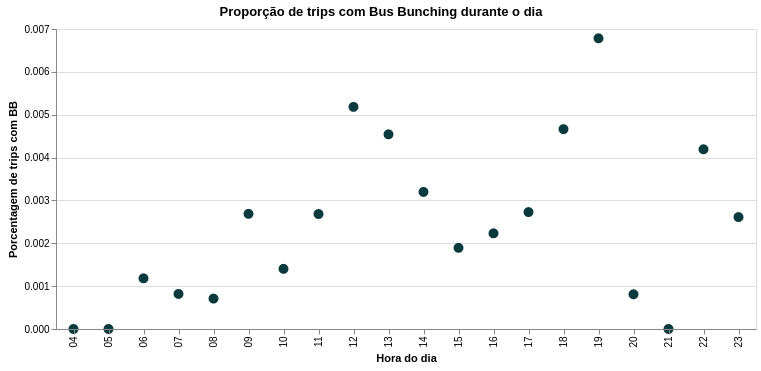

In [42]:
VegaLite({
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "width": 700,
  "height": 300,
  "title": "Proporção de trips com Bus Bunching durante o dia",
  "data": {
    "url": "https://gist.githubusercontent.com/veruskasantos/490655fcab74f0f7830f8081f65b6777/raw/24eb7fbc883aa121ee7e3e209c877fb63b67ae4f/bb_per_route_hour_curitiba.csv"
  },
  "mark": {
    "type": "point",
    "filled": True,
    "size": 100
  },
  "encoding": {
    "x": {
      "field": "time",
      "type": "ordinal",
      "title": "Hora do dia"
    },
    "y": {
      "field": "percTripsWithBB",
      "aggregate": "mean",
      "type": "quantitative",
      "title": "Porcentagem de trips com BB",
      "sort": "ascending"
    },
    "tooltip": [
      {
        "field": "time",
        "type": "ordinal",
        "title": "Hora"
      },
      {
        "field": "percTripsWithBB",
        "type": "quantitative",
        "aggregate": "mean",
        "title": "Trips with BB %"
      }
    ],
    "color": {
      "value": "#093A3E"
    }
  }
})